In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

In [3]:
#impath = "test.JPG"

# read in image
test_image = cv2.imread( "test.JPG")

# convert from BGR to RGB
test_image = cv2.cvtColor(test_image,cv2.COLOR_BGR2RGB)

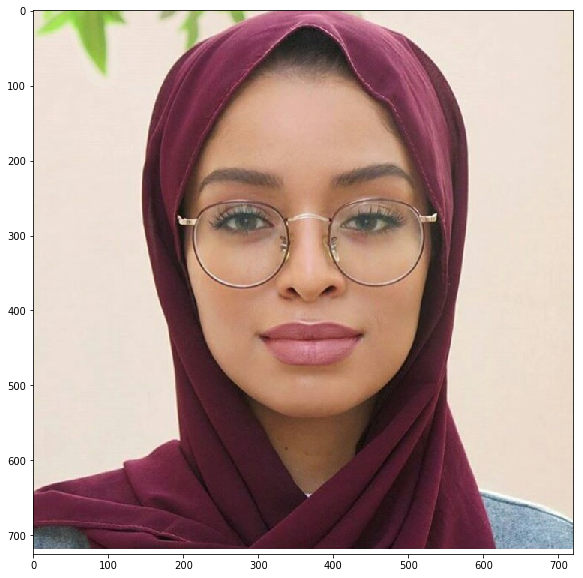

In [4]:
# display test_image
plt.figure(figsize=(10,10))
plt.imshow(test_image)

In [5]:
# create a gaussian noise
sigma = 10
noise = np.random.randn(*test_image.shape)*sigma

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


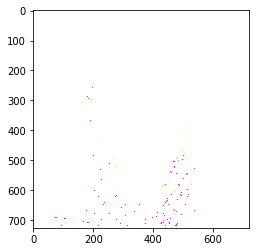

In [6]:
# add noise to image
noise_image = noise + test_image
plt.imshow(noise_image) # Does not display properly because of float values

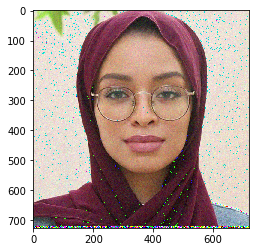

In [7]:
# noise image is a float (confirm this)
# images should be of type uint8 (for 8 bit images)


noise_image= np.array(noise_image,np.uint8)
plt.imshow(noise_image)

In [10]:
## write a fuction that applies a kernel to an image
# using cv2.filter2D
def applykernel(image, kernel):
    
    output = cv2.filter2D(image,-1,kernel)
    
    return output


## a function that displays an image
def display(img):
    plt.figure(figsize=(10,10))
    plt.imshow(img)

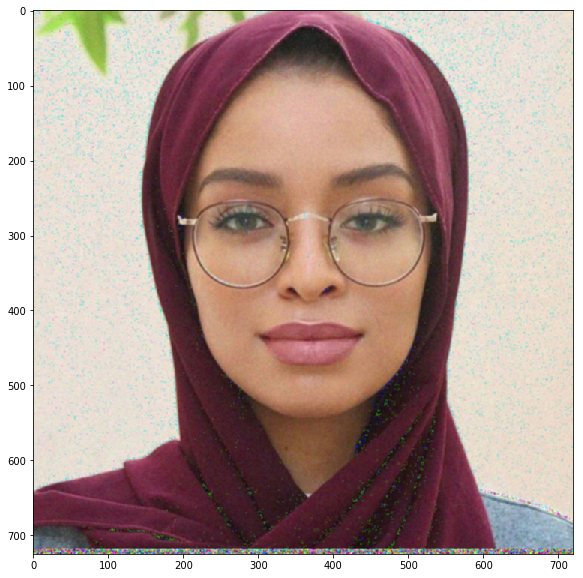

In [13]:
averagingkernel = np.ones((3, 3)) * (1/9) # you can always change the values and get amazing results
output = applykernel(noise_image, averagingkernel)

# display output
display(output)

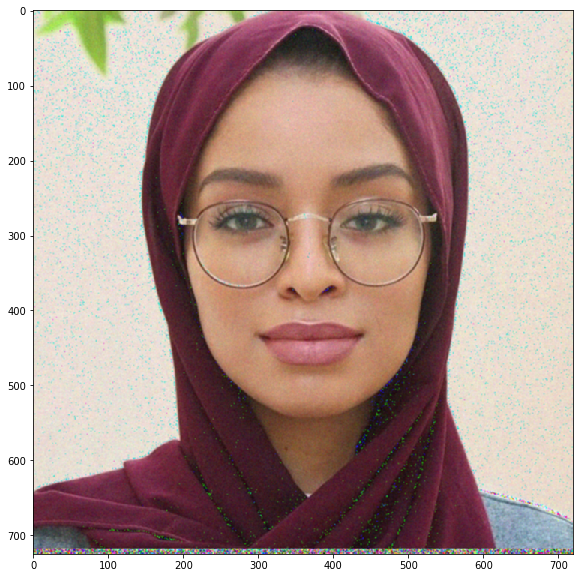

In [15]:
gaussianKernel = np.array((1, 2, 1, 2, 4, 2, 1, 2, 1))
gaussianKernel = np.reshape(gaussianKernel, (3, 3)) * (1/16)
output = applykernel(noise_image, gaussianKernel)

# display output
display(output)

In [75]:
gaussianKernel.shape

(3, 3)

# smoothing/blurring can also be achieved by using opencv's blur functions

cv2.blur(img, kernel_size),

cv2.GaussianBlur(img,kernel_size, sigma)

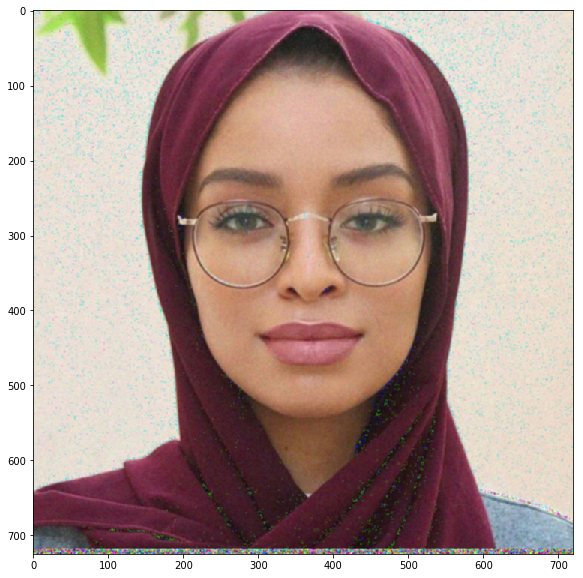

In [16]:
output = cv2.blur(noise_image, (3, 3))
display(output)

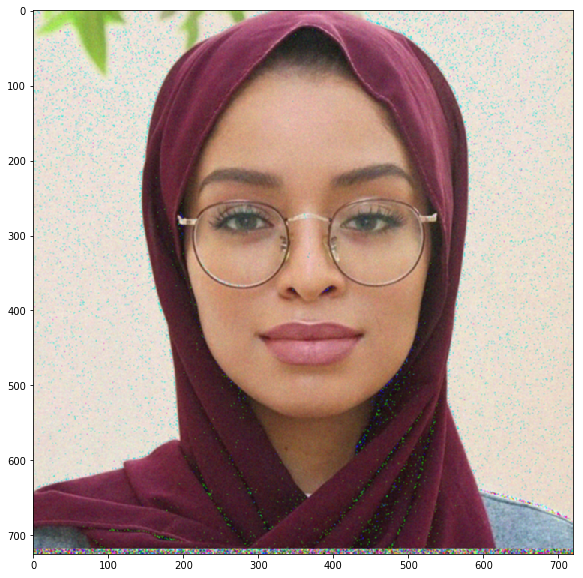

In [17]:
## TODO
# use c2.GaussianBlur to blur the noise image
output = output = cv2.GaussianBlur(noise_image, (3, 3), 0)
display(output)

### working with salt and pepper noise

In [18]:
mask = (np.random.random(test_image.shape[:-1]) > 0.9) # pick random values from the test_image(width,height) and check if they are greater than 0.9
noise =  mask \
        * np.random.random(test_image.shape[:-1])\
        *random.choice([0])
noise = np.expand_dims(noise, -1) # this adds an extra row or col
mask = 1-np.expand_dims(mask, -1)

noise_image = noise + mask*test_image

noise_image = np.array(noise_image, dtype=np.uint8)

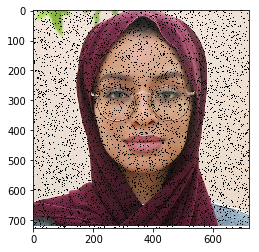

In [19]:
plt.imshow(noise_image)

# using the median filter

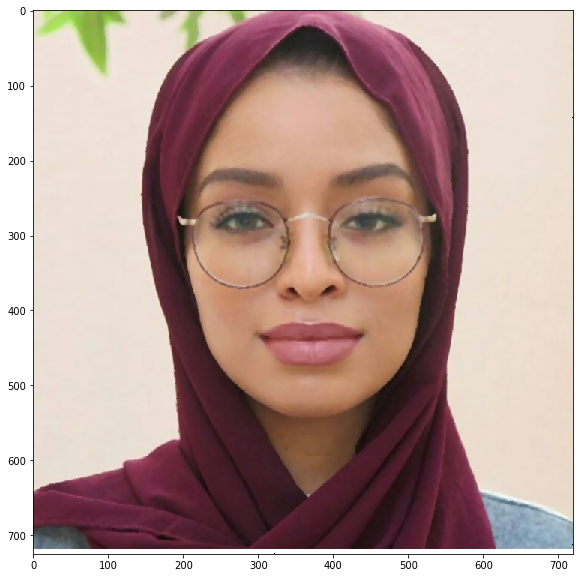

In [20]:
median = cv2.medianBlur(noise_image, 5)
display(median)

In [21]:
kernel = np.zeros((3,3), np.float32)
kernel[1,1] = 2
k2 = 1/9 * np.ones((1,1))
kernel = kernel - k2
# kernel2 = np.ones((5,5),np.float32)/25

In [24]:
kernel = np.zeros((3,3), np.float32)

In [25]:
kernel[1,1] = 2

In [26]:
print(kernel)

[[0. 0. 0.]
 [0. 2. 0.]
 [0. 0. 0.]]


In [27]:
np.ones((1,1))

array([[1.]])

In [29]:
k2 = 1/9 * np.ones((1,1))

In [30]:
kernel = kernel - k2

In [31]:
kernel

array([[-0.11111111, -0.11111111, -0.11111111],
       [-0.11111111,  1.88888889, -0.11111111],
       [-0.11111111, -0.11111111, -0.11111111]])

In [32]:
kernel2 = np.ones((5,5),np.float32)/25

In [33]:
kernel2

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

In [ ]:
#kernel = 1/8 * np.array([[0,0,0],[2,2,2],[0,0,0]], np.float32)
im = cv2.resize(test_image, (10,10))
output = applyKernel(test_image, kernel)
display(test_image)

In [34]:
np.array([[0,0,0],[2,2,2],[0,0,0]], np.float32)

array([[0., 0., 0.],
       [2., 2., 2.],
       [0., 0., 0.]], dtype=float32)

In [35]:

im = cv2.resize(test_image, (10,10))

In [36]:
im

array([[[237, 226, 215],
        [241, 231, 220],
        [239, 224, 216],
        [138,  64,  88],
        [143,  64,  96],
        [ 61,  34,  43],
        [191, 111, 136],
        [241, 228, 219],
        [239, 226, 217],
        [238, 225, 216]],

       [[239, 225, 216],
        [242, 226, 218],
        [109,  51,  71],
        [105,  41,  63],
        [216, 176, 149],
        [217, 176, 155],
        [117,  57,  78],
        [101,  55,  65],
        [237, 224, 215],
        [237, 224, 215]],

       [[237, 225, 213],
        [237, 223, 214],
        [ 97,  34,  51],
        [204, 154, 122],
        [218, 174, 149],
        [216, 171, 148],
        [213, 174, 149],
        [171,  96, 116],
        [238, 225, 216],
        [236, 224, 212]],

       [[236, 223, 214],
        [238, 224, 215],
        [102,  40,  49],
        [169, 113, 100],
        [167, 116,  85],
        [163, 109,  75],
        [132,  96,  82],
        [108,  50,  65],
        [236, 224, 211],
        [235, 222, 

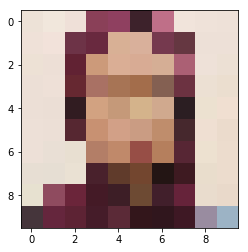

In [37]:
plt.imshow(im)

In [39]:
output = applykernel(test_image, kernel)

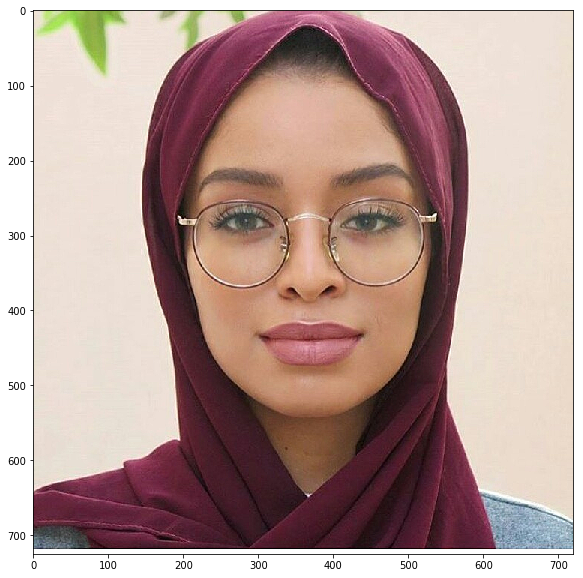

In [41]:
display(output)

In [45]:
test_image.shape#[:-1]

(725, 720, 3)

In [52]:
np.random.random((2,2))#test_image.shape[:-1])

array([[0.59693896, 0.30529881],
       [0.4296382 , 0.14074386]])

In [53]:
np.random.random(test_image.shape[:-1]) > 0.9

array([[ True, False, False, ...,  True,  True, False],
       [False, False, False, ...,  True, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [54]:
mask = (np.random.random(test_image.shape[:-1]) > 0.9)

In [64]:
random.choice([8,6,4,5])#random.choice([0])

8

In [66]:
noise =  mask \
        * np.random.random(test_image.shape[:-1])\
        *random.choice([0])

In [69]:
[* np.random.random(test_image.shape[:-1])]

[array([0.96703815, 0.14901244, 0.72816373, 0.82727964, 0.88881958,
        0.60749398, 0.0191166 , 0.78297284, 0.48679538, 0.79764461,
        0.66758158, 0.43173195, 0.75890794, 0.16583181, 0.16800057,
        0.18359502, 0.66697388, 0.74535621, 0.0322547 , 0.78978188,
        0.97960819, 0.77947462, 0.62758923, 0.55346988, 0.6902738 ,
        0.02740325, 0.85080446, 0.70333367, 0.62919762, 0.78286712,
        0.76948879, 0.989383  , 0.74811275, 0.63865293, 0.89264995,
        0.9312399 , 0.33750779, 0.86676762, 0.27567728, 0.58440788,
        0.1322772 , 0.17591992, 0.9838205 , 0.56498925, 0.55161741,
        0.21711322, 0.98462913, 0.75453619, 0.4740848 , 0.3407907 ,
        0.94109852, 0.64151048, 0.58454269, 0.9905432 , 0.53549351,
        0.522859  , 0.45488711, 0.59036124, 0.12909141, 0.33512773,
        0.29602531, 0.69987624, 0.43090469, 0.85256237, 0.22280698,
        0.08882821, 0.21336297, 0.13418434, 0.53365653, 0.71847533,
        0.30333585, 0.66057023, 0.10691512, 0.83

C:\Users\Kenechi\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: Both axis > a.ndim and axis < -a.ndim - 1 are deprecated and will raise an AxisError in the future.
  """Entry point for launching an IPython kernel.


array([[[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]],

       [[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]],

       [[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]],

       ...,

       [[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]],

       [[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]],

       [[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [0.]]])